In [2]:
# Debugging the deployment with vinn neighbors 
# This will go through the saved deployment, get each element in that using TactileVision dataset 
# and find the nearest neighbors for separately both the tactile and the vision image
# and together for both as well

import glob
import h5py
import hydra
import mmap
import numpy as np
import os
import pickle
import torch 
import matplotlib.pyplot as plt
import torchvision.transforms as T
import torch.utils.data as data 

from omegaconf import DictConfig, OmegaConf
from collections import OrderedDict
from tqdm import tqdm 
from torch.nn.parallel import DistributedDataParallel as DDP
from holobot.robot.allegro.allegro_kdl import AllegroKDL

from tactile_learning.utils.constants import *
from tactile_learning.models.custom import *
from tactile_learning.datasets.tactile_vision import *
from tactile_learning.deployment.load_models import * 
from tactile_learning.deployment.nn_buffer import NearestNeighborBuffer
from tactile_learning.models.knn import KNearestNeighbors, ScaledKNearestNeighbors
from tactile_learning.utils.visualization import *
from tactile_learning.utils.tactile_image import *

In [3]:
TEST_ROOTS = ['/home/irmak/Workspace/Holo-Bot/deployment_data/box_handle_lifting/demonstration_image_tactile_kinova_scaled_knn_3']
REPR_DIR = '/home/irmak/Workspace/Holo-Bot/extracted_data/box_handle_lifting/box_location_changing/training'
REPR_ROOTS = sorted(glob.glob(f'{REPR_DIR}/demonstration_*'))

TACTILE_ENCODER_OUT_DIR = '/home/irmak/Workspace/tactile-learning/tactile_learning/out/2023.01.12/22-08_tactile_byol_bs_128_tactile_play_data'
IMAGE_ENCODER_OUT_DIR = '/home/irmak/Workspace/tactile-learning/tactile_learning/out/2023.01.10/20-22_image_byol_bs_32_box_handle_lifting/box_location_changing/training'

class TINNStarter:
    def __init__(self):
        os.environ["MASTER_ADDR"] = "localhost"
        os.environ["MASTER_PORT"] = "29505"

        torch.distributed.init_process_group(backend='gloo', rank=0, world_size=1)
        torch.cuda.set_device(0)

        device = torch.device('cuda:0')
        self.tactile_cfg, self.tactile_encoder, self.tactile_transform = self._init_encoder_info(device, TACTILE_ENCODER_OUT_DIR, 'tactile')
        self.image_cfg, self.image_encoder, self.image_transform = self._init_encoder_info(device, IMAGE_ENCODER_OUT_DIR, 'image')
        self.inv_image_transform = self._get_inverse_image_norm()

        self.repr_data = load_data(REPR_ROOTS)
        self.test_data = load_data(TEST_ROOTS)

        self.repr_types = ['image', 'tactile'] # This could change
        self.repr_idx = {'image':[0,512], 'tactile':[512,576]}

        self._get_all_representations()
        self._get_all_test_repr()

        tactile_idx = self.repr_idx['tactile']
        image_idx = self.repr_idx['image']
        self.tactile_knn = ScaledKNearestNeighbors(
            self.all_repr[:,tactile_idx[0]:tactile_idx[1]],
            self.all_repr[:,tactile_idx[0]:tactile_idx[1]],
            ['tactile']
        )
        self.image_knn = ScaledKNearestNeighbors(
            self.all_repr[:,image_idx[0]:image_idx[1]],
            self.all_repr[:,image_idx[0]:image_idx[1]],
            ['image']
        )
        self.all_knn = ScaledKNearestNeighbors(
            self.all_repr,
            self.all_repr,
            ['image', 'tactile']
        )

        self.K = 5
        self.TEST_NUM = len(self.test_data['tactile']['indices'])

                
    def plot_all_neighbors(self, repr_types):
        # Will be jumping test data 5 by 5
        if isinstance(repr_types, list):
            all_nn_idxs = self.all_neighbors[:,:,2] 
        elif repr_types == 'image':
            all_nn_idxs = self.all_neighbors[:,:,0]
        elif repr_types == 'tactile':
            all_nn_idxs = self.all_neighbors[:,:,1]

        print('all_nn_idxs: {}'.format(all_nn_idxs))

        tactile_indices = range(len(self.test_data['tactile']['indices']))[-40:]
        TEST_NUM = len(range(0, len(tactile_indices), 2))
        
        if isinstance(repr_types, list):
            figsize=((self.K+1)*8, TEST_NUM*3)
        else:
            figsize=((self.K+1)*4, TEST_NUM*3)
        fig, axs = plt.subplots(figsize=figsize, nrows=TEST_NUM, ncols=self.K+1) 
        axs[0][0].set_title("Actual")
        for i in range(self.K):
            axs[0][i+1].set_title(f"{i+1}th Neighbour")

        for axs_id, test_id in enumerate(tactile_indices[0::2]):
            test_demo_id, test_tactile_id = self.test_data['tactile']['indices'][test_id]
            test_tactile = self.test_data['tactile']['values'][test_demo_id][test_tactile_id]
            
            _, test_image_id = self.test_data['image']['indices'][test_id] 
            test_img = self.inv_image_transform(
                self._load_dataset_image(TEST_ROOTS, test_demo_id, test_image_id)
            ).numpy().transpose(1,2,0)
            test_img_cv2 = test_img*255

            self.plot_state(
                axs[axs_id][0], test_img_cv2, test_tactile, repr_types=repr_types
            )
            axs[axs_id][0].axis('off')

            for k in range(self.K):
                nn_id = all_nn_idxs[test_id, k]
                print('nn_id: {}'.format(nn_id))
                nn_demo_id, nn_tactile_id = self.repr_data['tactile']['indices'][nn_id]
                nn_tactile = self.repr_data['tactile']['values'][nn_demo_id][nn_tactile_id]
                
                _, nn_image_id = self.repr_data['image']['indices'][nn_id]
                nn_img = self.inv_image_transform(
                    self._load_dataset_image(REPR_ROOTS, nn_demo_id, nn_image_id)
                ).numpy().transpose(1,2,0)
                nn_img_cv2 = nn_img*255
                self.plot_state(
                    axs[axs_id][k+1], nn_img_cv2, nn_tactile, repr_types=repr_types
                )
                axs[axs_id][k+1].axis('off')
                

    def plot_state(self, ax, image, tactile_values, repr_types):
        title = 'vinn_debug_dumped'
        if isinstance(repr_types, list):
            dump_whole_state(tactile_values, None, None, title=title, vision_state=image)
            curr_state = cv2.imread(f'{title}.png')
        elif repr_types == 'image':
            cv2.imwrite(f'{title}_vision.png', image)
            curr_state = cv2.imread(f'{title}_vision.png')
        elif repr_types == 'tactile':
            dump_tactile_state(tactile_values)
            curr_state = cv2.imread('tactile_state.png')

        ax.imshow(curr_state)

    def get_all_neigbors(self):
        # This will return a numpy array of: (TEST_NUM, 5, id_in_all_repr)
        repr_size = sum([self.repr_idx[repr_type][1]-self.repr_idx[repr_type][0] for repr_type in self.repr_types])
        print('REPR_SIZE in GET_ALL_NEIGHBORS: {}'.format(repr_size))
        self.all_neighbors = np.zeros((
            len(self.test_repr), self.K, 3 # ids for each repr combination (image, tactile, [image,tactile])
        )).astype(int)
        for test_id, test_repr in enumerate(self.test_repr):
            image_neighbor_ids, tactile_neighbor_ids, all_repr_ids = self._get_one_neighbor_for_all_types(test_repr)
            print('test_id: {} image_neighbor_ids: {}'.format(test_id, image_neighbor_ids))
            self.all_neighbors[test_id,:,0] = image_neighbor_ids[:]
            self.all_neighbors[test_id,:,1] = tactile_neighbor_ids[:]
            self.all_neighbors[test_id,:,2] = all_repr_ids[:]

    def _get_one_neighbor_for_all_types(self, test_repr):
        image_repr = test_repr[self.repr_idx['image'][0]:self.repr_idx['image'][1]]
        tactile_repr = test_repr[self.repr_idx['tactile'][0]:self.repr_idx['tactile'][1]]

        _, image_neighbor_ids = self.image_knn.get_k_nearest_neighbors(image_repr, k=self.K)
        _, tactile_neighbor_ids = self.tactile_knn.get_k_nearest_neighbors(tactile_repr, k=self.K)
        _, all_repr_ids= self.all_knn.get_k_nearest_neighbors(test_repr, k=self.K)

        return image_neighbor_ids, tactile_neighbor_ids, all_repr_ids

    # Will get all values in test_dir and return a numpy array
    def _get_all_test_repr(self):
        size = len(self.test_data['tactile']['indices'])
        self.test_repr = np.zeros((
            size, 576
        ))
        pbar = tqdm(total=size)
        pbar.set_description('Getting all test representations: ')
        for id in range(size):
            demo_id, tactile_id = self.test_data['tactile']['indices'][id]
            _, image_id = self.test_data['image']['indices'][id]

            tactile_values = self.test_data['tactile']['values'][demo_id][tactile_id]
            image = self._load_dataset_image(TEST_ROOTS, demo_id, image_id)

            one_repr = self._get_one_representation(image, tactile_values)
            for repr_type in self.repr_types:
                type_idx = self.repr_idx[repr_type]
                self.test_repr[id,type_idx[0]:type_idx[1]] = one_repr[repr_type][:]

            pbar.update(1)
        pbar.close()

    def _get_one_representation(self, image, tactile_values):
        # Will always return both representations in a dict
        tactile_image = self._get_tactile_image(tactile_values).unsqueeze(dim=0)
        tactile_repr = self.tactile_encoder(tactile_image)
        tactile_repr = tactile_repr.detach().cpu().numpy().squeeze()

        image_repr = self.image_encoder(image.unsqueeze(dim=0))
        image_repr = image_repr.detach().cpu().numpy().squeeze()

        total_repr = dict(
            image = image_repr, 
            tactile = tactile_repr
        )

        return total_repr 

    def _get_all_representations(self):
        size = len(self.repr_data['tactile']['indices'])
        self.all_repr = np.zeros((
            size, 576
        ))
        pbar = tqdm(total=size)
        pbar.set_description('Getting all representations: ')
        for id in range(size):
            demo_id, tactile_id = self.repr_data['tactile']['indices'][id]
            _, image_id = self.repr_data['image']['indices'][id]

            tactile_values = self.repr_data['tactile']['values'][demo_id][tactile_id]
            image = self._load_dataset_image(REPR_ROOTS, demo_id, image_id)

            one_repr = self._get_one_representation(image, tactile_values)
            for repr_type in self.repr_types:
                type_idx = self.repr_idx[repr_type]
                self.all_repr[id,type_idx[0]:type_idx[1]] = one_repr[repr_type][:]

            pbar.update(1)

        pbar.close()

    def _init_encoder_info(self, device, out_dir, encoder_type='tactile'): # encoder_type: either image or tactile
        cfg = OmegaConf.load(os.path.join(out_dir, '.hydra/config.yaml'))
        model_path = os.path.join(out_dir, 'models/byol_encoder_best.pt')
        encoder = load_model(cfg, device, model_path)
        encoder.eval() 
        if encoder_type == 'tactile':
            transform = T.Compose([
                T.Resize((16,16)),
                T.Normalize(TACTILE_IMAGE_MEANS, TACTILE_IMAGE_STDS),
            ])
        elif encoder_type == 'image':
            transform = T.Compose([
                T.Resize((480,640)),
                T.Lambda(crop_transform),
                T.ToTensor(),
                T.Normalize(VISION_IMAGE_MEANS, VISION_IMAGE_STDS),
            ]) 

        return cfg, encoder, transform

    def _get_inverse_image_norm(self):
        np_means = np.asarray(VISION_IMAGE_MEANS)
        np_stds = np.asarray(VISION_IMAGE_STDS)

        inv_normalization_transform = T.Compose([
            T.Normalize(mean = [0,0,0], std = 1 / np_stds ), 
            T.Normalize(mean = -np_means, std = [1,1,1])
        ])

        return inv_normalization_transform

    def _get_tactile_image(self, tactile_value):
        tactile_image = get_tactile_image(tactile_value)
        return self.tactile_transform(tactile_image)

    def _load_dataset_image(self, roots, demo_id, image_id):
        
        image_root = roots[demo_id]
        image_path = os.path.join(image_root, 'cam_0_rgb_images/frame_{}.png'.format(str(image_id).zfill(5)))
        img = self.image_transform(loader(image_path))
        return torch.FloatTensor(img)



In [4]:
tinn = TINNStarter()



cfg.learner_type: tactile_byol
cfg.learner_type: image_byol


Getting all test representations: : 100%|██████████| 82/82 [00:02<00:00, 33.98it/s]

self.index_values: {'tactile': [0, 64]}
self.index_values: {'image': [0, 512]}
self.index_values: {'image': [0, 512], 'tactile': [512, 576]}


In [4]:
tinn.get_all_neigbors()

REPR_SIZE in GET_ALL_NEIGHBORS: 576
test_id: 0 image_neighbor_ids: [792 786 622 791 615]
test_id: 1 image_neighbor_ids: [792 791 786 622 800]
test_id: 2 image_neighbor_ids: [1290  835  828  830  673]
test_id: 3 image_neighbor_ids: [ 673  828  835 1290  834]
test_id: 4 image_neighbor_ids: [720 668 673 667 828]
test_id: 5 image_neighbor_ids: [ 720 1378  667  668  713]
test_id: 6 image_neighbor_ids: [711 712 821 710 713]
test_id: 7 image_neighbor_ids: [711 712 710 600 821]
test_id: 8 image_neighbor_ids: [711 710 864 596 821]
test_id: 9 image_neighbor_ids: [ 608 1379  822  868  720]
test_id: 10 image_neighbor_ids: [709 865 822 608 823]
test_id: 11 image_neighbor_ids: [ 822  608  865 1283 1379]
test_id: 12 image_neighbor_ids: [865 708 709 822 823]
test_id: 13 image_neighbor_ids: [822 608 603 865 823]
test_id: 14 image_neighbor_ids: [ 608  822  603  865 1379]
test_id: 15 image_neighbor_ids: [708 709 604 823 603]
test_id: 16 image_neighbor_ids: [603 714 608 709 604]
test_id: 17 image_neighbor

all_nn_idxs: [[ 385  862  500 1461  707]
 [ 703  500 3007 1461  607]
 [ 457 1770 1771 1427   25]
 [ 457  459 3006   25 2764]
 [2599 1071 1124 1070 2590]
 [  31   32   33   34   35]
 [  32   33   31   34   36]
 [  32   33   31   34  185]
 [1194  186  183  185  184]
 [1194 1920  186  183  185]
 [1194 1920   50 2442  186]
 [1194 1920  186  183  185]
 [1194 1920  186  183  185]
 [1194 1920  186 2442 1919]
 [ 900 1920 1194   50 2442]
 [1194 1920  900   50 2442]
 [1920  900 1194   50 2442]
 [ 900 1194 1920   50 2442]
 [ 900   50 1194 1920 2442]
 [ 900   50 2442 2443 1194]
 [ 900   50 2442 2443 1194]
 [ 900   50 2442 2443  902]
 [ 900   50 2442 2443  902]
 [ 900   50 1194 1920 2442]
 [1194 1920   50 2442 2443]
 [1194 1920   50 2442  186]
 [1194 1920   50  186 2442]
 [1194 1920  900 2442 2443]
 [1194 1920  900  471 3005]
 [ 188  186  183  184  185]
 [ 186  188  183  184  185]
 [ 186  188  183  184  185]
 [ 186  188  183  184  185]
 [ 186  188  183  184  185]
 [ 186  183  184  185  188]
 [1194 

TypeError: list indices must be integers or slices, not list

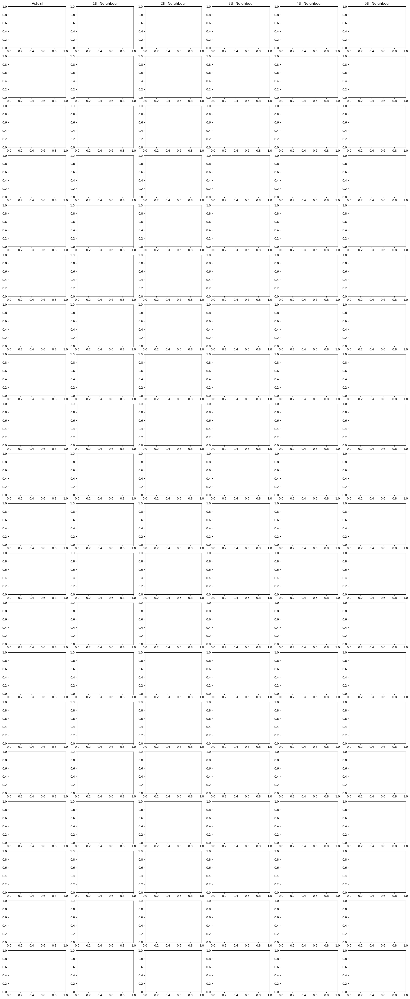

In [5]:
tinn.plot_all_neighbors(None, repr_types='tactile')

In [11]:
def plot_all_neighbors(repr_data, all_neighbors, test_data, repr_types):
    # Will be jumping test data 5 by 5
    if isinstance(repr_types, list):
        all_nn_idxs = all_neighbors[:,:,2] 
    elif repr_types == 'image':
        all_nn_idxs = all_neighbors[:,:,0]
    elif repr_types == 'tactile':
        all_nn_idxs = all_neighbors[:,:,1]

    print('all_nn_idxs: {}'.format(all_nn_idxs))

    tactile_indices = range(len(test_data['tactile']['indices']))[-40:]
    # image_indices = test_data['image']['indices'][-40:]
    print('tactile_indices: {}'.format(tactile_indices))
    # print('image_indices: {}'.format(image_indices))
    # return 
    TEST_NUM = len(range(0, len(tactile_indices), 2))
    if isinstance(repr_types, list):
        figsize=((tinn.K+1)*8, TEST_NUM*3)
    else:
        figsize=((tinn.K+1)*4, TEST_NUM*3)
    fig, axs = plt.subplots(figsize=figsize, nrows=TEST_NUM, ncols=tinn.K+1) 
    # fig, axs = plt.subplots(figsize=(tinn.K*4, TEST_NUM*4), nrows=TEST_NUM, ncols=tinn.K+1) 
    axs[0][0].set_title("Actual")
    for i in range(tinn.K):
        axs[0][i+1].set_title(f"{i+1}th Neighbour")

    for axs_id, test_id in enumerate(tactile_indices[0::2]):
    # for axs_id, test_id in enumerate(range(0, len(tactile_indices), 2)):
        print('test_id: {}'.format(test_id))
        test_demo_id, test_tactile_id = test_data['tactile']['indices'][test_id]
        test_tactile = test_data['tactile']['values'][test_demo_id][test_tactile_id]
        
        _, test_image_id = test_data['image']['indices'][test_id] 
        test_img = tinn.inv_image_transform(
            tinn._load_dataset_image(TEST_ROOTS, test_demo_id, test_image_id)
        ).numpy().transpose(1,2,0)
        # test_img_cv2 = cv2.cvtColor(test_img*255, cv2.COLOR_RGB2BGR)
        test_img_cv2 = test_img*255

        tinn.plot_state(
            axs[axs_id][0], test_img_cv2, test_tactile, repr_types=repr_types
        )
        axs[axs_id][0].axis('off')

        for k in range(tinn.K):
            nn_id = all_nn_idxs[test_id, k]
            print('nn_id: {}'.format(nn_id))
            nn_demo_id, nn_tactile_id = repr_data['tactile']['indices'][nn_id]
            nn_tactile = repr_data['tactile']['values'][nn_demo_id][nn_tactile_id]
            
            _, nn_image_id = repr_data['image']['indices'][nn_id]
            nn_img = tinn.inv_image_transform(
                tinn._load_dataset_image(REPR_ROOTS, nn_demo_id, nn_image_id)
            ).numpy().transpose(1,2,0)
            # nn_img_cv2 = cv2.cvtColor(nn_img*255, cv2.COLOR_RGB2BGR)
            nn_img_cv2 = nn_img*255
            tinn.plot_state(
                axs[axs_id][k+1], nn_img_cv2, nn_tactile, repr_types=repr_types
            )
            axs[axs_id][k+1].axis('off')


all_nn_idxs: [[ 792  786  622  791  615]
 [ 792  791  786  622  800]
 [1290  835  828  830  673]
 [ 673  828  835 1290  834]
 [ 720  668  673  667  828]
 [ 720 1378  667  668  713]
 [ 711  712  821  710  713]
 [ 711  712  710  600  821]
 [ 711  710  864  596  821]
 [ 608 1379  822  868  720]
 [ 709  865  822  608  823]
 [ 822  608  865 1283 1379]
 [ 865  708  709  822  823]
 [ 822  608  603  865  823]
 [ 608  822  603  865 1379]
 [ 708  709  604  823  603]
 [ 603  714  608  709  604]
 [ 603  714  604  605  608]
 [ 714  603  604  709  608]
 [ 714  602  603  713  606]
 [ 603  604  605  714  721]
 [ 714  603  604  602  605]
 [ 714  603  602  605  604]
 [ 714  603  602  606  608]
 [ 714  603  606  602  608]
 [ 606  603  714  608  605]
 [ 605  607  603  604  721]
 [ 722  606  724  608  603]
 [ 722  724  723  608 1378]
 [ 722  724  723  608 1378]
 [ 722  724  723  674  673]
 [ 722  724  723  674  673]
 [ 724  722  723  674  673]
 [ 724  722  723  674  673]
 [ 724  722  723  674  609]
 [ 724 

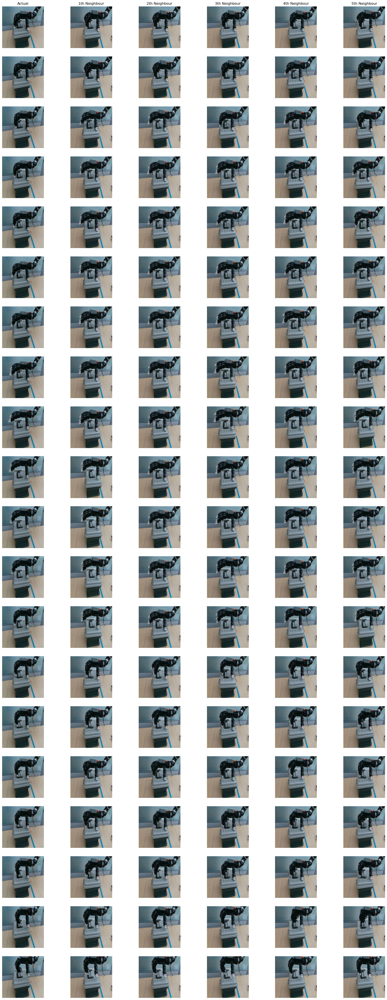

In [12]:
plot_all_neighbors(tinn.repr_data, tinn.all_neighbors.astype(int), tinn.test_data, repr_types = 'image')

all_nn_idxs: [[ 385  862  500 1461  707]
 [ 703  500 3007 1461  607]
 [ 457 1770 1771 1427   25]
 [ 457  459 3006   25 2764]
 [2599 1071 1124 1070 2590]
 [  31   32   33   34   35]
 [  32   33   31   34   36]
 [  32   33   31   34  185]
 [1194  186  183  185  184]
 [1194 1920  186  183  185]
 [1194 1920   50 2442  186]
 [1194 1920  186  183  185]
 [1194 1920  186  183  185]
 [1194 1920  186 2442 1919]
 [ 900 1920 1194   50 2442]
 [1194 1920  900   50 2442]
 [1920  900 1194   50 2442]
 [ 900 1194 1920   50 2442]
 [ 900   50 1194 1920 2442]
 [ 900   50 2442 2443 1194]
 [ 900   50 2442 2443 1194]
 [ 900   50 2442 2443  902]
 [ 900   50 2442 2443  902]
 [ 900   50 1194 1920 2442]
 [1194 1920   50 2442 2443]
 [1194 1920   50 2442  186]
 [1194 1920   50  186 2442]
 [1194 1920  900 2442 2443]
 [1194 1920  900  471 3005]
 [ 188  186  183  184  185]
 [ 186  188  183  184  185]
 [ 186  188  183  184  185]
 [ 186  188  183  184  185]
 [ 186  188  183  184  185]
 [ 186  183  184  185  188]
 [1194 

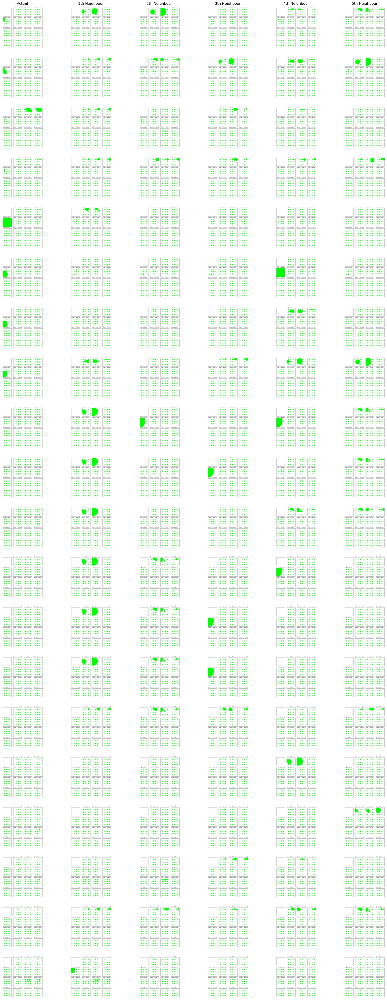

In [13]:
plot_all_neighbors(tinn.repr_data, tinn.all_neighbors.astype(int), tinn.test_data, repr_types = 'tactile')

In [1]:
plot_all_neighbors(tinn.repr_data, tinn.all_neighbors.astype(int), tinn.test_data, repr_types = ['image','tactile'])

NameError: name 'plot_all_neighbors' is not defined